In [24]:
import numpy as np
import xarray as xr
import matplotlib
import math


from xarray import DataTree
# from xmip.postprocessing import _parse_metric

import cartopy.crs as ccrs

# import xskillscore as xs
import matplotlib.pyplot as plt
%matplotlib inline
import calendar
from matplotlib.lines import Line2D

import os
import re
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy.stats import norm
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import matplotlib.patches as patches

import pandas as pd
from scipy.stats import norm
from scipy.special import erfc


# Plotting SST gradient, trend for all percentiles, and trend Vs. mean state plots 

### SST gradient 
east-west and cold-warm temperature gradients 
east-west: 

lon and lat are 

cold-warm 


warmest 50% minus codlest 50%

### Trend for all percentiles 

Maximum spread and standard error

### trend vs. mean state 

subfig 1: trend coldes 15% vs. cold-warm trend
subfig 2: ect. 

--------------------------------

## Load Data 

Processed on Gadi

In [25]:
noaa_metrics = {'percentiles': 0.000776700915003186, 'eulerian': 0.0011179155352855083}
cobe_metrics = {'percentiles': 0.0008697542122712153, 'eulerian': 0.0010641552293092658}
hadley_metrics = {'percentiles': 0.0006815426391838442, 'eulerian': 0.0009097251046705565}

had_cold_warm = hadley_metrics['percentiles'] 
cobe_cold_warm = cobe_metrics['percentiles']
noaa_cold_warm = noaa_metrics['percentiles']

had_east_west = hadley_metrics['eulerian']
cobe_east_west = cobe_metrics['eulerian']
noaa_east_west = noaa_metrics['eulerian']

Function to make a large array so you can plot with seaborn. 

In [26]:
dt_cmip_cold_warm = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cold_warm_trend_cmip_pacific_198201-202001_lat20.nc')
dt_cmip_east_west = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_east_west_trend_cmip_pacific_198201-202001_lat20.nc')

In [27]:
models =['CESM1-CAM5',
 'CanESM2',
 'GFDL-ESM2M',
 'MPI-ESM',
 'ACCESS-ESM1-5',
 'CanESM5',
 'EC-Earth3',
 'IPSL-CM6A-LR',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM1-2-LR',
 'CESM2',
 'GFDL-SPEAR-MED']

data_tree=dt_cmip_east_west

mods = {}
for model_name, model_data in data_tree.items():
    en=[]
    for ensemble_name, ensemble_data in data_tree[model_name].items():
        en.extend([str(ensemble_name)])
    
    mods[str(model_name)]=en

In [46]:
# code needed to use seaborn - getting it to be a data array 
# data input needs to be in datatree form: 
#                                         models
#                                           |_______ ensemble members

def main_dataarray(data):

    trend_dt=data
    model_array={}
    # # print('converting datatree to arrays for each model')
    for m in range(len(models)):
        
        sources = mods[models[m]][0:len(mods[models[m]])]
        da=[] # initialise array for grad values
        for i in range(len(sources)):
            da.extend([trend_dt[models[m]+'/'+sources[i]].grad.values.item()]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
        model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})
    
    print('initial arrays done')
    
    # Create an empty DataArray
    main_array = xr.DataArray()
    
    ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes
    
    # Loop through each model
    for model, ensemble_size in zip(models, ensemble_sizes):
        # Generate random data for the example
        data_values = model_array[models.index(model)] 
        ensemble_members = mods[model]
    
        # Create a DataArray for each ensemble member
        data = xr.DataArray(
            data_values,
            dims=['ensemble_member'],
            coords={'ensemble_member': ensemble_members},
            name='temp'
        )
    
        # Concatenate along a new dimension representing different models
        main_array = xr.concat([main_array, data], dim='model')
    
    print('main_array_done')

    return main_array



In [47]:
# code needed to use seaborn - getting it to be a data array 
# data input needs to be in datatree form: 
#                                         models
#                                           |_______ ensemble members

def main_dataarray_trend_type(data):

    trend_dt=data
    model_array={}
    # # print('converting datatree to arrays for each model')
    for m in range(len(models)):
        
        sources = mods[models[m]][0:len(mods[models[m]])]
        da=[] # initialise array for grad values
        for i in range(len(sources)):
            da.extend([trend_dt[models[m]+'/'+sources[i]].grad.values[0]]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
        
        model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})
    
    print('initial arrays done')
    
    # Create an empty DataArray
    main_array = xr.DataArray()
    
    ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes
    
    # Loop through each model
    for model, ensemble_size in zip(models, ensemble_sizes):
        # Generate random data for the example
        data_values = model_array[models.index(model)] 
        ensemble_members = mods[model]
    
        # Create a DataArray for each ensemble member
        data = xr.DataArray(
            data_values,
            dims=['ensemble_member'],
            coords={'ensemble_member': ensemble_members},
            name='temp'
        )
    
        # Concatenate along a new dimension representing different models
        main_array = xr.concat([main_array, data], dim='model')
    
    print('main_array_done')

    return main_array



In [48]:
# cmip_ma_eul30=main_dataarray(CMIP_ma_eul['lat(-30,30)'])
# cmip_ma_eul5=main_dataarray(CMIP_ma_eul['lat(-5,5)'])
cmip_ma_eul20=main_dataarray(dt_cmip_east_west)

# cmip_warmcold_wills30=main_dataarray(CMIP_warmcold_wills['lat(-30,30)'])
# cmip_warmcold_wills5=main_dataarray(CMIP_warmcold_wills['lat(-5,5)'])
cmip_warmcold_wills20=main_dataarray(dt_cmip_cold_warm)

initial arrays done
main_array_done
initial arrays done
main_array_done


## Ploting SST gradients

/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/261845844.py:149: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=all2, fill=True, vertical=True, ax=ax2, color='red', alpha=0.3, linewidth=0.2, common_norm=True)
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/261845844.py:150: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=all, fill=True, vertical=True, ax=ax2, color='blue', alpha=0.3, linewidth=0.2, common_norm=True)
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/261845844.py:179: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


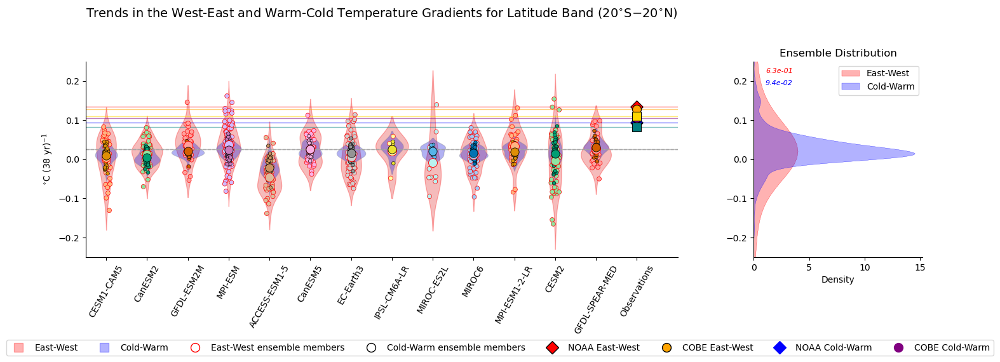

In [49]:
# Define Observations
## pd.DataFrame(data=[[scalar_value]], columns=['ColumnName'])

noaa_p = pd.DataFrame(data=[noaa_cold_warm], columns=['Observations']).iloc[0]*10*12
cobe_p = pd.DataFrame(data=[cobe_cold_warm], columns=['Observations']).iloc[0]*10*12
had_p = pd.DataFrame(data=[had_cold_warm], columns=['Observations']).iloc[0]*10*12

noaa_e = pd.DataFrame(data=[noaa_east_west], columns=['Observations']).iloc[0]*10*12
cobe_e = pd.DataFrame(data=[cobe_east_west], columns=['Observations']).iloc[0]*10*12
had_e = pd.DataFrame(data=[had_east_west], columns=['Observations']).iloc[0]*10*12



# percentile data 
data = cmip_warmcold_wills20*10*12
df_percentile = data.to_dataframe('trend').reset_index()
df_mean_percentile = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index()


# normal
data2 = cmip_ma_eul20*10*12
df_eul = data2.to_dataframe('trend').reset_index()
df_mean_eul = data2.mean(dim='ensemble_member').to_dataframe('trend').reset_index()



#### Find p-values 
eval=(noaa_e.values[0]+cobe_e.values[0])/2
pval=(noaa_p.values[0]+cobe_p.values[0])/2
 

p_eul = np.ones(11)
p_per = np.ones(11)

for i in range(1,12):
    data2val = data2.isel(model=i).values
    dt2=data2val[~np.isnan(data2val)]
    z_eul = (eval-np.mean(dt2))/np.std(dt2)
    p_eul[i-1] = 2 * (1 - norm.cdf(np.abs(z_eul)))

    dataval = data.isel(model=i).values
    dt=dataval[~np.isnan(dataval)]
    z_score = (pval-np.mean(dt))/np.std(dt)
    p_per[i-1] = 2 * (1 - norm.cdf(np.abs(z_score)))


del data2val, dt2, z_eul, z_score

# normalise all ensembles 

normalized_data = (data / data.sum(dim='ensemble_member'))
normalized_data2 =(data2 / data2.sum(dim='ensemble_member'))


all = normalized_data.stack(stack=('model', 'ensemble_member')).values
all2 = normalized_data2.stack(stack=('model', 'ensemble_member')).values



z_eul = (eval-np.mean(all2[~np.isnan(all2)]))/np.std(all2[~np.isnan(all2)])
peul_all = 2 * (1 - norm.cdf(np.abs(z_eul)))


z_score = (pval-np.mean(all[~np.isnan(all)]))/np.std(all[~np.isnan(all)])
parea_all = 2 * (1 - norm.cdf(np.abs(z_score)))


# Create a single figure with 6 rows and 3 columns of subplots
fig = plt.figure(figsize=(17, 4))
gs = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[3.5, 1], wspace=0.2)  # Adjust wspace as needed

# Existing subplot
ax = plt.subplot(gs[0])


# Draw horizontal line for red observation point (NOAA)
plt.axhline(y=noaa_p.iloc[0], color='blue', linestyle='-', linewidth=1,alpha=0.5)
plt.axhline(y=cobe_p.iloc[0], color='purple', linestyle='-', linewidth=1,alpha=0.5)
plt.axhline(y=had_p.iloc[0], color='teal', linestyle='-', linewidth=1,alpha=0.5)

# Draw horizontal line for blue observation point (COBE)
plt.axhline(y=noaa_e.iloc[0], color='red', linestyle='-', linewidth=1,alpha = 0.5)
plt.axhline(y=cobe_e.iloc[0], color='orange', linestyle='-', linewidth=1,alpha = 0.5)
plt.axhline(y=had_e.iloc[0], color='gold', linestyle='-', linewidth=1,alpha = 0.5)


# Plot gray lines for the mean of 'all' and 'all2'
ax.axhline(y=np.mean(all[~np.isnan(all)]), color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean of all')
ax.axhline(y=np.mean(all2[~np.isnan(all2)]), color='darkgray', linestyle='-', linewidth=1, alpha=0.7, label='Mean of all2')

# Plot using Seaborn


# # plotting eul all ensemble membersL color red
ax = sns.stripplot(x='model', y='trend', data=df_eul, hue='model', palette='pastel', edgecolor='red',
                   linewidth=0.5, alpha=1, legend=False, size=5)
# # plotting percentile all ensemble members: color black
axp = sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette='colorblind', edgecolor='black',
                   linewidth=0.43, alpha=1, legend=False, size=4,jitter=0.05)
# # plot mean of eul ensemble members: color red
ax = sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette='pastel', edgecolor='red',
                   linewidth=0.65, alpha=1, legend=False, size=10)

# plot mean of percentile ensemble members: color black
axp = sns.stripplot(x='model', y='trend', data=df_mean_percentile, hue='model', palette='colorblind', edgecolor='black',
                   linewidth=0.6, alpha=1, legend=False, size=9.5)



# plotting violin plot of eul ensemble members: color red
ax = sns.violinplot(x='model', y='trend', data=df_eul, inner=None, color='red', alpha=0.3, linewidth=0.9,
                    edgecolor='red')

# plotting violin plot of percentile ensemble members: color blue
axp = sns.violinplot(x='model', y='trend', data=df_percentile, inner=None, color='blue', alpha=0.35, linewidth=0.8,
                edgecolor='grey')

sns.stripplot(data=noaa_p, color="blue", marker="D", size=10,linewidth=0.8,edgecolor='black')
sns.stripplot(data=noaa_e, color="red", marker="D", size=10,linewidth=0.8,edgecolor='black')


sns.stripplot(data=cobe_p, color="purple", marker="o", size=10,linewidth=0.8,edgecolor='black')
sns.stripplot(data=cobe_e, color="orange", marker="o", size=10,linewidth=0.8,edgecolor='black')

sns.stripplot(data=had_p, color="teal", marker="s", size=10,linewidth=0.8,edgecolor='black')
sns.stripplot(data=had_e, color="gold", marker="s", size=10,linewidth=0.8,edgecolor='black')

ax.spines[['right', 'top']].set_visible(False)
ax.set_ylim(-0.25, 0.25)
ax.set_xlim(0.5, 15)
ax.set_xlabel(None)
ax.set_xticks(range(1, len(models)+2))
ax.set_xticklabels(models+['Observations'], rotation=60)
ax.set_ylabel(r'$^{\circ}$C (38 yr)$^{-1}$')
ax.set_title(r'Trends in the West-East and Warm-Cold Temperature Gradients for Latitude Band (20$^{\circ}$S$-$20$^{\circ}$N)', fontsize=14,y=1.2)

# New subplot
ax2 = plt.subplot(gs[1], sharey=ax)

# Print p-values in figure 2
ax2.text(0.15, 0.95, f"{peul_all:.1e}", color='red', fontsize=8, fontdict={'style': 'italic'}, horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)
ax2.text(0.15, 0.89, f"{parea_all:.1e}", color='blue', fontsize=8, fontdict={'style': 'italic'}, horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)


# Additional subplot content
# all = data2.stack(stack=('model', 'ensemble_member')).values
# all2 = data.stack(stack=('model', 'ensemble_member')).values

sns.kdeplot(data=all2, fill=True, vertical=True, ax=ax2, color='red', alpha=0.3, linewidth=0.2, common_norm=True)
sns.kdeplot(data=all, fill=True, vertical=True, ax=ax2, color='blue', alpha=0.3, linewidth=0.2, common_norm=True)
ax2.legend(['East-West', 'Cold-Warm'])

# Set labels, titles, and adjust layout as needed for the new subplot
ax2.spines[['right', 'top']].set_visible(False)
ax2.set_xlabel('Density')
ax2.set_ylabel(None)#(r'$^{\circ}$C (38 yr)$^{-1}$')
ax2.set_title("Ensemble Distribution")

# Adjust the subplot layout to make room for the legend


# Define legend handles
legend_handles = [
    Line2D([0], [0], marker='s', color='red', markerfacecolor='red', markersize=10, linestyle='None',alpha =0.3),
    Line2D([0], [0], marker='s', color='blue', markerfacecolor='blue', markersize=10, linestyle='None',alpha=0.3),
    Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=10, linestyle='None',linewidth=4),
    Line2D([0], [0], marker='o', color='black', markerfacecolor='none', markersize=10, linestyle='None',linewidth=4),
    Line2D([0], [0], marker='D', color='red', markerfacecolor='red', markersize=10, markeredgecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='orange', markerfacecolor='orange', markersize=10, markeredgecolor='black', linestyle='None'),
    Line2D([0], [0], marker='D', color='blue', markerfacecolor='blue', markersize=10, markeredgecolor='blue', linestyle='None'),
    Line2D([0], [0], marker='o', color='purple', markerfacecolor='purple', markersize=10, markeredgecolor='purple', linestyle='None'),
]

# Add legend
ax.legend(legend_handles, ['East-West', 'Cold-Warm', 'East-West ensemble members', 'Cold-Warm ensemble members', 'NOAA East-West', 'COBE East-West', 'NOAA Cold-Warm', 'COBE Cold-Warm'], loc='upper center', bbox_to_anchor=(0.7, -0.4), ncol=8)
# Annotate models with p-values above the strip plots in the first subplot

# Adjust the subplot layout to make room for the legend
plt.tight_layout()

# plt.savefig(os.path.expanduser("~/Desktop/fig3.png"), bbox_inches='tight')


/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/872053377.py:103: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_eul, hue='model',palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/872053377.py:107: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/872053377.py:148: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_1

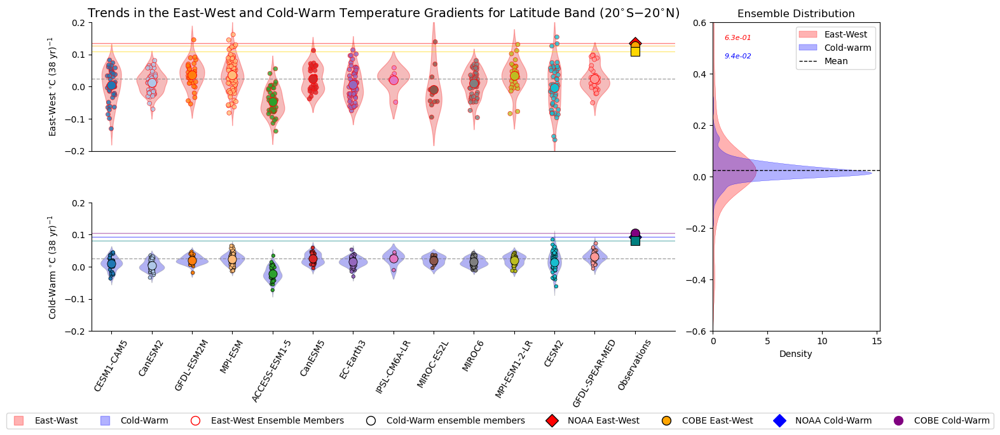

In [50]:
# Define Observations
# pd.DataFrame(data=[[scalar_value]], columns=['ColumnName'])
noaa_p = pd.DataFrame(data=[noaa_cold_warm], columns=['Observations']).iloc[0]*10*12
cobe_p = pd.DataFrame(data=[cobe_cold_warm], columns=['Observations']).iloc[0]*10*12
had_p = pd.DataFrame(data=[had_cold_warm], columns=['Observations']).iloc[0]*10*12

noaa_e = pd.DataFrame(data=[noaa_east_west], columns=['Observations']).iloc[0]*10*12
cobe_e = pd.DataFrame(data=[cobe_east_west], columns=['Observations']).iloc[0]*10*12
had_e = pd.DataFrame(data=[had_east_west], columns=['Observations']).iloc[0]*10*12


# percentile data 
data = cmip_warmcold_wills20*10*12
df_percentile = data.to_dataframe('trend').reset_index()
df_mean_percentile = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index()


# normal
data2 = cmip_ma_eul20*10*12
df_eul = data2.to_dataframe('trend').reset_index()
df_mean_eul = data2.mean(dim='ensemble_member').to_dataframe('trend').reset_index()



#### Find p-values 
eval=(noaa_e.values[0]+cobe_e.values[0])/2
pval=(noaa_p.values[0]+cobe_p.values[0])/2
 

p_eul = np.ones(11)
p_per = np.ones(11)

for i in range(1,12):
    data2val = data2.isel(model=i).values
    dt2=data2val[~np.isnan(data2val)]
    z_eul = (eval-np.mean(dt2))/np.std(dt2)
    p_eul[i-1] = 2 * (1 - norm.cdf(np.abs(z_eul)))

    dataval = data.isel(model=i).values
    dt=dataval[~np.isnan(dataval)]
    z_score = (pval-np.mean(dt))/np.std(dt)
    p_per[i-1] = 2 * (1 - norm.cdf(np.abs(z_score)))


del data2val, dt2, z_eul, z_score

# normalise all ensembles 

normalized_data = (data / data.sum(dim='ensemble_member'))
normalized_data2 =(data2 / data2.sum(dim='ensemble_member'))


all = normalized_data.stack(stack=('model', 'ensemble_member')).values
all2 = normalized_data2.stack(stack=('model', 'ensemble_member')).values


z_eul = (eval-np.mean(all2[~np.isnan(all2)]))/np.std(all2[~np.isnan(all2)])
peul_all = 2 * (1 - norm.cdf(np.abs(z_eul)))


z_score = (pval-np.mean(all[~np.isnan(all)]))/np.std(all[~np.isnan(all)])
parea_all = 2 * (1 - norm.cdf(np.abs(z_score)))


colors = sns.color_palette([
    '#ff9896',  # Light Red
    '#1f77b4',  # Bold Blue
    '#aec7e8',  # Light Blue
    '#ff7f0e',  # Bold Orange
    '#ffbb78',  # Light Orange
    '#2ca02c',  # Bold Green
    '#d62728',  # Bold Red
    '#9467bd',  # Bold Purple
    '#e377c2',  # Light Pink
    '#8c564b',  # Bold Brown
    '#7f7f7f',  # Gray
    '#bcbd22',  # Bold Yellow-Green
    '#17becf'   # Bold Cyan
])
# Create a single figure with 2 columns and 3 rows of subplots
fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(3, 2, figure=fig, width_ratios=[3.5, 1], height_ratios=[1, 1, 1], wspace=0.1, hspace=0.4)  # Adjust hspace as needed

# Existing first subplot
ax1 = plt.subplot(gs[0, 0])


# Draw horizontal line for blue observation point (COBE)
ax1.axhline(y=noaa_e.iloc[0], color='red', linestyle='-', linewidth=1, alpha=0.5)
ax1.axhline(y=cobe_e.iloc[0], color='orange', linestyle='-', linewidth=1, alpha=0.5)
ax1.axhline(y=had_e.iloc[0], color='gold', linestyle='-', linewidth=1, alpha=0.5)


# Plot gray lines for the mean of 'all' and 'all2'
ax1.axhline(y=np.mean(all[~np.isnan(all)]), color='gray', linestyle='--', linewidth=1, alpha=0.7
            
            )

# ax1.axhline(y=np.mean(all2[~np.isnan(all2)]), color='darkgray', linestyle='-', linewidth=1, alpha=0.7, label='Mean of all2')

# Plot using Seaborn
# Plotting eul all ensemble membersL color red
sns.stripplot(x='model', y='trend', data=df_eul, hue='model',palette=colors, edgecolor='red',
              linewidth=0.5, alpha=0.8, legend=False, size=5, ax=ax1)

# Plot mean of eul ensemble members: color red
sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
              linewidth=0.65, alpha=1, legend=False, size=10, ax=ax1)


# Plotting violin plot of eul ensemble members: color red
sns.violinplot(x='model', y='trend', data=df_eul, inner=None, color='red', alpha=0.3, linewidth=0.9,
               edgecolor='red', ax=ax1)


# sns.stripplot(data=noaa_p, color="blue", marker="D", size=10, linewidth=0.8, edgecolor='black', ax=ax1)
sns.stripplot(data=noaa_e, color="red", marker="D", size=10, linewidth=0.8, edgecolor='black', ax=ax1)

# sns.stripplot(data=cobe_p, color="purple", marker="o", size=10, linewidth=0.8, edgecolor='black', ax=ax1)
sns.stripplot(data=cobe_e, color="orange", marker="o", size=10, linewidth=0.8, edgecolor='black', ax=ax1)

sns.stripplot(data=had_e, color="gold", marker="s", size=10, linewidth=0.8, edgecolor='black', ax=ax1)


ax1.spines[['right', 'top']].set_visible(False)
ax1.set_ylim(-0.2, 0.2)
ax1.set_xlim(0.5, 13)
ax1.set_xlabel(None)
ax1.set_xticks(range(1, 13))
# Remove x tick labels
ax1.axes.get_xaxis().set_visible(False)
ax1.set_ylabel(r'East-West $^{\circ}$C (38 yr)$^{-1}$')
ax1.set_title(r'Trends in the East-West and Cold-Warm Temperature Gradients for Latitude Band (20$^{\circ}$S$-$20$^{\circ}$N)', fontsize=14)

# Repeat the first plot directly underneath the first subfigure
ax3 = plt.subplot(gs[1, 0], sharex=ax1, sharey=ax1)

# Redraw the same elements in the repeated plot
ax3.axhline(y=noaa_p.iloc[0], color='blue', linestyle='-', linewidth=1, alpha=0.5)
ax3.axhline(y=cobe_p.iloc[0], color='purple', linestyle='-', linewidth=1, alpha=0.5)
ax3.axhline(y=had_p.iloc[0], color='teal', linestyle='-', linewidth=1, alpha=0.5)


ax3.axhline(y=np.mean(all[~np.isnan(all)]), color='gray', linestyle='--', linewidth=1, alpha=0.7)


# Plotting percentile all ensemble members: color black
sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.43, alpha=1, legend=False, size=4, jitter=0.05, ax=ax3)

# Plot mean of percentile ensemble members: color black
sns.stripplot(x='model', y='trend', data=df_mean_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.6, alpha=1, legend=False, size=9.5, ax=ax3)

# Plotting violin plot of percentile ensemble members: color blue
sns.violinplot(x='model', y='trend', data=df_percentile, inner=None, color='blue', alpha=0.35, linewidth=0.8,
               edgecolor='grey', ax=ax3)

sns.stripplot(data=noaa_p, color="blue", marker="D", size=10, linewidth=0.8, edgecolor='black', ax=ax3)
# sns.stripplot(data=noaa_e, color="red", marker="D", size=10, linewidth=0.8, edgecolor='black', ax=ax3)

sns.stripplot(data=cobe_p, color="purple", marker="o", size=10, linewidth=0.8, edgecolor='black', ax=ax3)
# sns.stripplot(data=cobe_e, color="orange", marker="o", size=10, linewidth=0.8, edgecolor='black', ax=ax3)

sns.stripplot(data=had_p, color="teal", marker="s", size=10, linewidth=0.8, edgecolor='black', ax=ax3)


ax3.spines[['right', 'top']].set_visible(False)
ax3.set_ylim(-0.2, 0.2)
ax3.set_xlim(0.5, 15)
ax3.set_xlabel(None)
ax3.set_xticks(range(1, 15))
ax3.set_xticklabels(models+['Observations'], rotation=60)
ax3.set_ylabel(r'Cold-Warm $^{\circ}$C (38 yr)$^{-1}$')

# 'Ensemble distribution' subplot in the middle
ax2 = plt.subplot(gs[0:2, 1])

# Print p-values in figure 2
ax2.text(0.15, 0.95, f"{peul_all:.1e}", color='red', fontsize=8, fontdict={'style': 'italic'}, horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)
ax2.text(0.15, 0.89, f"{parea_all:.1e}", color='blue', fontsize=8, fontdict={'style': 'italic'}, horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)

# Additional subplot content
sns.kdeplot(data=all2, fill=True, vertical=True, ax=ax2, color='red', alpha=0.3, linewidth=0.2, common_norm=True)
sns.kdeplot(data=all, fill=True, vertical=True, ax=ax2, color='blue', alpha=0.3, linewidth=0.2, common_norm=True)
ax2.axhline(y=np.mean(all[~np.isnan(all)]), color='black', linestyle='--', linewidth=1, alpha=1)

ax2.legend(['East-West', 'Cold-warm','Mean'])

# Set labels, titles, and adjust layout as needed for the new subplot
ax2.set_xlabel('Density')
ax2.set_ylabel(None)
ax2.set_title("Ensemble Distribution")
ax2.set_ylim(-0.6, 0.6)

# Define legend handles
legend_handles = [
    Line2D([0], [0], marker='s', color='red', markerfacecolor='red', markersize=10, linestyle='None', alpha=0.3),
    Line2D([0], [0], marker='s', color='blue', markerfacecolor='blue', markersize=10, linestyle='None', alpha=0.3),
    Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=10, linestyle='None', linewidth=4),
    Line2D([0], [0], marker='o', color='black', markerfacecolor='none', markersize=10, linestyle='None', linewidth=4),
    Line2D([0], [0], marker='D', color='red', markerfacecolor='red', markersize=10, markeredgecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='orange', markerfacecolor='orange', markersize=10, markeredgecolor='black', linestyle='None'),
    Line2D([0], [0], marker='D', color='blue', markerfacecolor='blue', markersize=10, markeredgecolor='blue', linestyle='None'),
    Line2D([0], [0], marker='o', color='purple', markerfacecolor='purple', markersize=10, markeredgecolor='purple', linestyle='None')
]

# Add legend
ax1.legend(legend_handles, ['East-Wast', 'Cold-Warm', 'East-West Ensemble Members', 'Cold-Warm ensemble members', 'NOAA East-West', 'COBE East-West', 'NOAA Cold-Warm', 'COBE Cold-Warm'], loc='upper center', bbox_to_anchor=(0.7, -2), ncol=8)

# Adjust the subplot layout to make room for the legend
plt.tight_layout()
plt.savefig(os.path.expanduser("~/Desktop/fig2.pdf"), bbox_inches='tight')



east-west mean: 0.01309000967974231
east-west std: 0.05233490310574332
cold-warm mean: 0.014705295355533709
cold-warm std: 0.02207175066385349
east-west obs mean: 0.12367183477061323
cold-warm obs mean: 0.09311991065832982


/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:163: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_eul, hue='model', palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:165: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:197: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykern

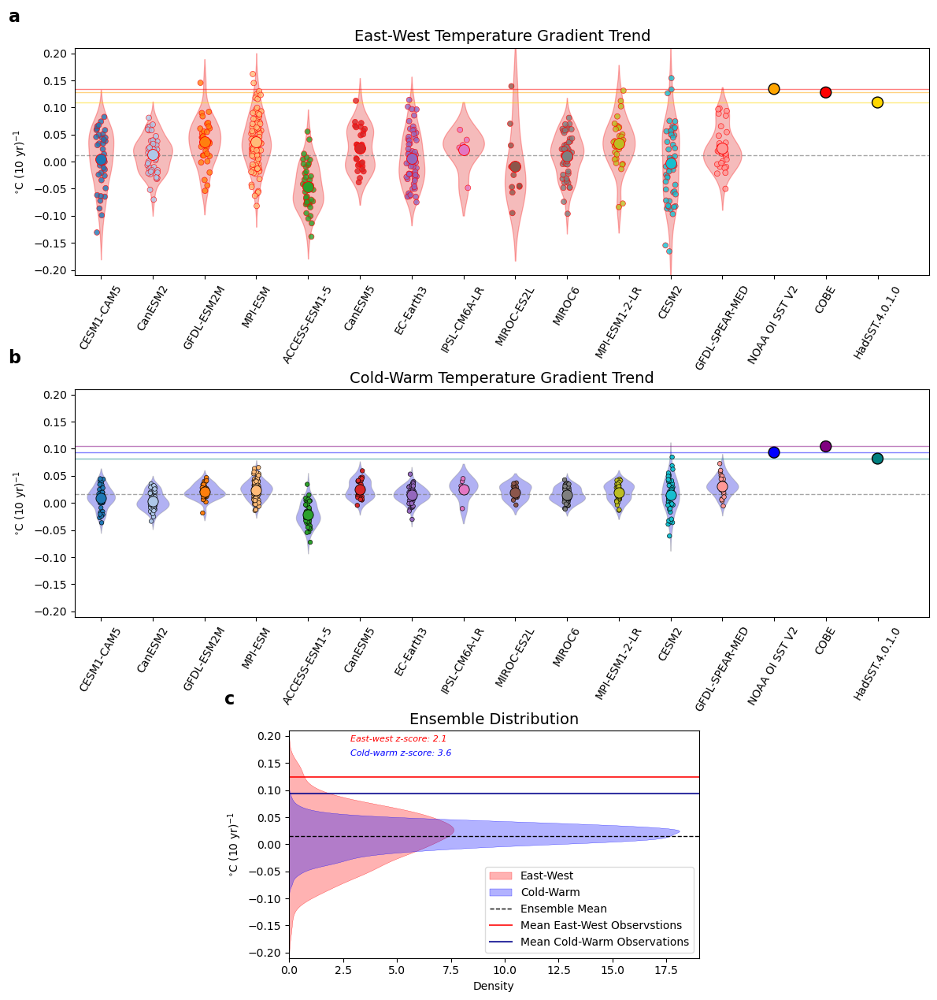

In [51]:
# Define Observations
# Prepare Observations Data for Seaborn
obs_data_p = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'Cold-Warm': np.array([noaa_cold_warm, cobe_cold_warm, had_cold_warm])*10*12
})

obs_data_e = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'East-West': np.array([noaa_east_west, cobe_east_west, had_east_west])*10*12
})

# percentile data 
data = cmip_warmcold_wills20*10*12
df_percentile = data.to_dataframe('trend').reset_index()
df_mean_percentile = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index()


# normal
data2 = cmip_ma_eul20*10*12
df_eul = data2.to_dataframe('trend').reset_index()
df_mean_eul = data2.mean(dim='ensemble_member').to_dataframe('trend').reset_index()

# Calculate the mean for East-West and Cold-Warm gradients
mean_east_west_obs = np.mean([noaa_east_west, cobe_east_west, had_east_west])*10*12
mean_cold_warm_obs = np.mean([noaa_cold_warm, cobe_cold_warm, had_cold_warm])*10*12



# Initialize lists to store the flattened data and corresponding weights
all_values = []
all2_values = []
weights_all = []
weights_all2 = []

# Loop through each model and its ensemble members
for i in range(data.sizes['model']):
    # Extract non-NaN values for the current model and flatten them
    model_data = data.isel(model=i).values.flatten()
    valid_data = model_data[~np.isnan(model_data)]  # Keep only non-NaN values

    model_data2 = data2.isel(model=i).values.flatten()
    valid_data2 = model_data2[~np.isnan(model_data2)]  # Keep only non-NaN values

    # Skip models with no valid data to avoid division by zero
    if len(valid_data) == 0 or len(valid_data2) == 0:
        continue

    # Calculate weights (1 / ensemble size) for each valid data point
    weight = 1 / len(valid_data)
    weight2 = 1 / len(valid_data2)

    weights_all.extend([weight] * len(valid_data))
    weights_all2.extend([weight2] * len(valid_data2))

    # Store the valid data points
    all_values.extend(valid_data)
    all2_values.extend(valid_data2)

# Convert to numpy arrays for plotting
all_values = np.array(all_values)
all2_values = np.array(all2_values)
weights_all = np.array(weights_all)
weights_all2 = np.array(weights_all2)

# Ensure the lengths match
assert len(all_values) == len(weights_all), "Mismatch in data and weights length"
assert len(all2_values) == len(weights_all2), "Mismatch in data2 and weights2 length"



# calculate number of standard deviations mean obs are from the mean of the ensemble
z_eul = (mean_east_west_obs - np.mean(all2_values)) / np.std(all2_values)
z_per = (mean_cold_warm_obs - np.mean(all_values)) / np.std(all_values)

# print mean, and standard deviation
print('east-west mean:',np.mean(all2_values))
print('east-west std:',np.std(all2_values))
print('cold-warm mean:',np.mean(all_values))
print('cold-warm std:',np.std(all_values))

# print mean of obs 
print('east-west obs mean:',mean_east_west_obs)
print('cold-warm obs mean:',mean_cold_warm_obs)
##### Calculate the combined p-values
# from scipy.stats import norm
# import numpy as np

# from scipy.stats import norm
# from scipy.special import erfc
# import numpy as np

# # Calculate z-scores for each model (same logic as before)
# z_eul_scores = []
# z_per_scores = []

# for i in range(13):
#     # Handle East-West data (data2)
#     data2val = data2.isel(model=i).values
#     dt2 = data2val[~np.isnan(data2val)]

#     if np.std(dt2) > 0:
#         z_eul = (eval_metric - np.mean(dt2)) / np.std(dt2)
#         z_eul_scores.append(z_eul)
#     else:
#         z_eul_scores.append(0)  # No variability, z-score = 0

#     # Handle Cold-Warm data (data)
#     dataval = data.isel(model=i).values
#     dt = dataval[~np.isnan(dataval)]

#     if np.std(dt) > 0:
#         z_per = (pval_metric - np.mean(dt)) / np.std(dt)
#         z_per_scores.append(z_per)
#     else:
#         z_per_scores.append(0)  # No variability, z-score = 0

# # Convert lists to numpy arrays
# z_eul_scores = np.array(z_eul_scores)
# z_per_scores = np.array(z_per_scores)

# # Stouffer's method: Combine z-scores
# combined_z_eul = np.sum(z_eul_scores) / np.sqrt(len(z_eul_scores))
# combined_z_per = np.sum(z_per_scores) / np.sqrt(len(z_per_scores))

# # Calculate the combined p-values using erfc for better precision
# combined_p_eul = erfc(np.abs(combined_z_eul) / np.sqrt(2))
# combined_p_per = erfc(np.abs(combined_z_per) / np.sqrt(2))


colors = sns.color_palette([
    '#ff9896',  # Light Red
    '#1f77b4',  # Bold Blue
    '#aec7e8',  # Light Blue
    '#ff7f0e',  # Bold Orange
    '#ffbb78',  # Light Orange
    '#2ca02c',  # Bold Green
    '#d62728',  # Bold Red
    '#9467bd',  # Bold Purple
    '#e377c2',  # Light Pink
    '#8c564b',  # Bold Brown
    '#7f7f7f',  # Gray
    '#bcbd22',  # Bold Yellow-Green
    '#17becf'   # Bold Cyan
])

# Create a figure with 3 vertical panels (3 rows, 1 column)
fig = plt.figure(figsize=(14, 15))
gs = gridspec.GridSpec(3, 3, figure=fig, width_ratios=[1, 2.5, 1.1],hspace=0.5)  # Divide into 3 columns

### Panel 1: East-West Observations and Models Plot
ax1 = plt.subplot(gs[0, :])

# Observation lines for East-West gradient
ax1.axhline(y=noaa_e.iloc[0], color='red', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')
ax1.axhline(y=cobe_e.iloc[0], color='orange', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')
ax1.axhline(y=had_e.iloc[0], color='gold', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')

ax1.axhline(y=np.mean(df_mean_eul.trend), color='gray', linestyle='--', linewidth=1, alpha=0.7)


# Plot models data (unchanged)
sns.stripplot(x='model', y='trend', data=df_eul, hue='model', palette=colors, edgecolor='red',
              linewidth=0.5, alpha=0.8, legend=False, size=5, ax=ax1)
sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
              linewidth=0.65, alpha=1, legend=False, size=10, ax=ax1)
sns.violinplot(x='model', y='trend', data=df_eul, inner=None, color='red', alpha=0.3, linewidth=0.9,
               edgecolor='red', ax=ax1)

# Plot observation points
# Plot East-West observations
# Use matplotlib scatter for observations with black outlines
ax1.scatter('Source', 'East-West', data=obs_data_e, color=['orange', 'red', 'gold'], 
            edgecolor='black', s=100, marker='o', zorder=3)

# Axis settings for Panel 1
ax1.set_ylim(-0.21, 0.21)
ax1.set_xlim(0.5, 17)
ax1.set_xticks(range(1, 17))
ax1.set_xticklabels(models + ['NOAA OI SST V2', 'COBE', 'HadSST.4.0.1.0'], rotation=60)
ax1.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')
ax1.set_title('East-West Temperature Gradient Trend',fontsize=14)
ax1.set_xlabel(None)  # Remove the unwanted y-axis label

### Panel 2: Cold-Warm Observations and Models Plot
ax2 = plt.subplot(gs[1, :])

# Observation lines for Cold-Warm gradient
ax2.axhline(y=noaa_p.iloc[0], color='blue', linestyle='-', linewidth=1, alpha=0.5)
ax2.axhline(y=cobe_p.iloc[0], color='purple', linestyle='-', linewidth=1, alpha=0.5)
ax2.axhline(y=had_p.iloc[0], color='teal', linestyle='-', linewidth=1, alpha=0.5)

ax2.axhline(y=np.mean(df_mean_percentile.trend), color='gray', linestyle='--', linewidth=1, alpha=0.7)


# Plot models data (unchanged)
sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.43, alpha=1, legend=False, size=4, jitter=0.05, ax=ax2)
sns.stripplot(x='model', y='trend', data=df_mean_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.6, alpha=1, legend=False, size=9.5, ax=ax2)
sns.violinplot(x='model', y='trend', data=df_percentile, inner=None, color='blue', alpha=0.35, linewidth=0.8,
               edgecolor='grey', ax=ax2)

# Plot observation points
# Plot Cold-Warm observations
ax2.scatter('Source', 'Cold-Warm', data=obs_data_p, color=['blue', 'purple', 'teal'], 
            edgecolor='black', s=100, marker='o', zorder=3)

# Axis settings for Panel 2
ax2.set_ylim(-0.21, 0.21)
ax2.set_xlim(0.5, 17)
ax2.set_xticks(range(1, 17))
ax2.set_xticklabels(models + ['NOAA OI SST V2', 'COBE', 'HadSST.4.0.1.0'], rotation=60)
ax2.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')
ax2.set_title('Cold-Warm Temperature Gradient Trend',fontsize=14)
ax2.set_xlabel(None)  # Remove the unwanted y-axis label

### Panel 3: Ensemble Distribution Plot
ax3 = plt.subplot(gs[2, 1])

# KDE plots for ensemble distributions
# Plot the weighted KDEs
sns.kdeplot(all2_values, weights=weights_all2, fill=True, vertical=True, ax=ax3, 
            color='red', alpha=0.3, linewidth=0.2, common_norm=True, label='East-West')
sns.kdeplot(all_values, weights=weights_all, fill=True, vertical=True, ax=ax3, 
            color='blue', alpha=0.3, linewidth=0.2, common_norm=True, label='Cold-Warm')
ax3.axhline(y=np.mean(all_values), color='black', linestyle='--', 
            linewidth=1, alpha=1, label='Ensemble Mean')

# Plot means of NOAA, COBE, and HAD for East-West and Cold-Warm
ax3.axhline(y=mean_east_west_obs, color='red', linestyle='-', linewidth=1.5, alpha=0.8, label='Mean East-West Observstions')
ax3.axhline(y=mean_cold_warm_obs, color='darkblue', linestyle='-', linewidth=1.5, alpha=0.8, label='Mean Cold-Warm Observations')


# Add text for p-values
ax3.text(0.15, 0.95, f"East-west z-score: {z_eul:.2}", color='red', fontsize=8, fontdict={'style': 'italic'}, transform=ax3.transAxes)
ax3.text(0.15, 0.89, f"Cold-warm z-score: {z_per:.2}", color='blue', fontsize=8, fontdict={'style': 'italic'}, transform=ax3.transAxes)
ax3.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')

ax3.legend(loc='lower right', fontsize=10, frameon=True, framealpha=0.7)

# Axis settings for Panel 3
ax3.set_xlabel('Density')
ax3.set_ylim(-0.21, 0.21)
ax3.set_title('Ensemble Distribution', fontsize=14)

# Label for ax1 (top row, spanning all columns)
ax1.annotate('a', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')

# Label for ax2 (middle row, spanning all columns)
ax2.annotate('b', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')

# Label for ax3 (bottom row, center column only)
ax3.annotate('c', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')
# Adjust the subplot layout to make room for the legend
# plt.tight_layout()
plt.savefig(os.path.expanduser("~/Desktop/EastWest_ColdWarm.pdf"), bbox_inches='tight')



In [52]:
len(all_values)

519

In [53]:
eastwest_mean=0.01309000967974231
eastwest_std=0.05233490310574332
coldwarm_mean=0.014705295355533709
coldwarm_std=0.02207175066385349
eastwest_obs_mean= 0.12367183477061323
coldwarm_obs_mean=0.09311991065832982
n_eastwest = len(all2_values)
n_coldwarm = len(all_values)


# calculate p values of obs from east-west distribution

# calculate p-values for eas-west distribution
# Compute the cumulative distribution function (CDF)
cdf = norm.cdf(eastwest_obs_mean, loc=eastwest_mean, scale=eastwest_std)
# Compute two-tailed p-value
p_value_eastwest = 2 * min(cdf, 1 - cdf)
del cdf
print(p_value_eastwest)

# calculate p-values for cold-warm distribution
cdf = norm.cdf(coldwarm_obs_mean, loc=coldwarm_mean, scale=coldwarm_std)
p_value_coldwarm = 2 * min(cdf, 1 - cdf)
print(p_value_coldwarm)




0.034603752961685164
0.00038127890214689764


In [54]:
1/0.0346
1/2500

0.0004

## mean-state

In [56]:
mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/mean_state_dict.npy',allow_pickle='TRUE').item()
trends_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/trends_dict.npy',allow_pickle='TRUE').item()
mean_state_dict_normal = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/mean_state_dict_normal.npy',allow_pickle='TRUE').item()

# # percent
percent_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/percent_mean_state_dict.npy',allow_pickle='TRUE').item()
# percent_trends_dict = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/percent_trends_dict.npy',allow_pickle='TRUE').item()
# percent_mean_state_dict_normal = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/percent_mean_state_dict_normal.npy',allow_pickle='TRUE').item()
# mean_state_trop_rel_dict = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/mean_state_trop_rel_dict.npy',allow_pickle='TRUE').item()


# # percent
east_west_trend_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/east_west_trend_dict.npy',allow_pickle='TRUE').item()
east_west_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/east_west_mean_state_dict.npy',allow_pickle='TRUE').item()
warm_cold_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/warm_cold_mean_state_dict.npy',allow_pickle='TRUE').item()
warm_cold_trend_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/warm_cold_trend_dict.npy',allow_pickle='TRUE').item()


In [ ]:
percent_mean_state_dict

{'ACCESS-ESM1-5': array([9.28598553, 9.2512229 , 9.31194321, 9.23246238, 9.29203279,
        9.3313173 , 9.20568382, 9.38260693, 9.20787603, 9.27812039,
        9.2857174 , 9.20331857, 9.28790052, 9.20582777, 9.21831993,
        9.21404273, 9.15625806, 9.3663201 , 9.27747283, 9.2056279 ,
        9.17716315, 9.18329677, 9.11604406, 9.24591012, 9.34437956,
        9.15247829, 9.28836007, 9.29724014, 9.20967758, 9.24668055,
        9.12174064, 9.28370328, 9.38023632, 9.20253144, 9.2552166 ,
        9.22561403, 9.3754489 , 9.15436341, 9.22592493, 9.25358177]),
 'CanESM5': array([9.58832237, 9.51539724, 9.59572889, 9.60831042, 9.54446495,
        9.67730171, 9.59179491, 9.45505957, 9.49721228, 9.60222926,
        9.46720889, 9.51497871, 9.57534656, 9.48592973, 9.49825177,
        9.62554823, 9.50458089, 9.44741293, 9.56795176, 9.56323797,
        9.60816005, 9.56856435, 9.45800855, 9.4281265 , 9.43636539]),
 'IPSL-CM6A-LR': array([8.46572834, 8.38164889, 8.56866046, 8.36304163, 8.53032002,


In [57]:
dt_trends_maps = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/cmip_trend_maps.nc')

In [58]:
east_west_dict=extract_non_nan_values(cmip_ma_eul20,models)
cold_warm_dict=extract_non_nan_values(cmip_warmcold_wills20,models)

In [60]:
# Data for figure 5
dt_percentile_trends = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_percentiles_trend.nc')
dt_percentiles = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_percentile_cmip_pacific_198201-202001_lat20.nc')
# dt_gridded_pa = xr.open_datatree('/Users/isabelaconde/Desktop/final_data/dt_cmip_gridded_pa.nc')

# percentile data 
# data = cmip_warmcold_wills20*10*12
# east_west_dict = data.to_dataframe('trend').reset_index().to_dict(orient='records')
# mean_east_west_dict = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index().to_dict(orient='records')


# # a) axis [0,0]: east-west trend vs. up welling zone
# data2 = cmip_ma_eul20*10*12
# east_west_dict = extract_non_nan_values(data2,models)


# # trend of upwelling region (250,290) and (-20,0)
trend_upwelling_region = dt_trends_maps.sel(lat=slice(-20, 0), lon=slice(250, 290)).stack(stack=('lat', 'lon')).mean(dim='stack')*10*12
da_trend_upwelling_region = main_dataarray_trend_type(trend_upwelling_region)*10*12
trend_upwelling_region_dict=extract_non_nan_values(da_trend_upwelling_region,models)

# b) axis [0,1]: coldest 5% vs. cold warm trend
# cold-warm trend
# data = cmip_warmcold_wills20*10*12
# cold_warm_dict = extract_non_nan_values(data2,models)

# coldest 5%
# dt_coldest = dt_percentile_trends.sel(area = slice(0,0.05)).mean(dim='area')*10*12
# coldest_5_dict={}
# for m in models:
#     coldest_5_dict[m] = dt_coldest[m].grad.values


# d) axis [1,0]: mean state of coldest 5% vs. trend of coldest 5%
dt_percentiles_time_avg = dt_percentiles.sel(area = slice(0,0.05)).mean(dim='area').mean(dim='time')
da_mean_state_coldest5 = main_dataarray_trend_type(dt_percentiles_time_avg) #this just isn't working right
mean_state_coldest_5_dict=extract_non_nan_values(da_trend_upwelling_region,models)


# c) mean state and trend of upwelling region



AttributeError: 'DataTree' object has no attribute 'stack'

In [61]:
dt_trends_maps

<xarray.DataTree>
Group: /
├── Group: /CESM1-CAM5
│   ├── Group: /CESM1-CAM5/r14i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r30i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r28i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r40i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r2i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r7i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r5i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r38i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r1i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r8i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r25i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   

In [62]:
# upwelling region seperate
upwelling_region_mean_state = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_upwelling_region_mean_state_g025.nc')
upwelling_region_trend = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_upwelling_region_trend_g025.nc')

# coldest 5% 
coldest5_mean_state = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_coldest5_mean_state.nc')
coldest5_trend = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_coldest5_trend.nc')

In [63]:
obs_trend_coldest5 = [-0.00062513,-0.00081657, -0.00067994]
obs_mean_state_coldest5 =[21.06851115, 21.25174476, 21.09663085]

obs_trend_upwelling = [-0.0006169 , -0.00096884, -0.00065289]
obs_mean_state_upwelling = [21.77562904, 21.78511429, 21.57102402]




In [38]:
upwelling_region_mean_state

NameError: name 'upwelling_region_mean_state' is not defined

In [64]:
# main_dataarray(upwelling_region_mean_state)

trend_dt=upwelling_region_mean_state
model_array={}
# # print('converting datatree to arrays for each model')
for m in range(len(models)):
    
    sources = mods[models[m]][0:len(mods[models[m]])]
    da=[] # initialise array for grad values
    for i in range(len(sources)):
        da.extend([trend_dt[models[m]+'/'+sources[i]].tos.values]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
    
    model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})

print('initial arrays done')

# # Create an empty DataArray
main_array = xr.DataArray()

ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes

# Loop through each model
for model, ensemble_size in zip(models, ensemble_sizes):
    # print(models.index(model))
    data_values = model_array[models.index(model)] 
    ensemble_members = mods[model]

    # Create a DataArray for each ensemble member
    data = xr.DataArray(
        data_values,
        dims=['ensemble_member'],
        coords={'ensemble_member': ensemble_members},
        name='temp'
    )

    # Concatenate along a new dimension representing different models
    main_array = xr.concat([main_array, data], dim='model')

print('main_array_done')
main_array
mean_state_upwelling_region_dict=extract_non_nan_values(main_array,models)
mean_state_upwelling_region_dict

initial arrays done
main_array_done


{'CESM1-CAM5': array([22.36314002, 22.35156469, 22.53250655, 22.41969752, 22.36664562,
        22.46660902, 22.43814805, 22.55929719, 22.46240668, 22.48936792,
        22.5313483 , 22.4483489 , 22.46543568, 22.46493216, 22.41113556,
        22.38134826, 22.42182449, 22.45154154, 22.40902635, 22.49899625,
        22.49099913, 22.34502419, 22.40169615, 22.4357093 , 22.29576507,
        22.49326364, 22.40730237, 22.35481816, 22.52682887, 22.48556111,
        22.55725598, 22.50559946, 22.27881101, 22.48510112, 22.45349466,
        22.29378507, 22.45319474, 22.29249959, 22.35686435, 22.2142208 ]),
 'CanESM2': array([24.39425442, 24.25511718, 24.25380285, 24.15153856, 24.3662371 ,
        24.35306141, 24.21316955, 24.34595631, 24.33025902, 24.35466843,
        24.24431461, 24.23279147, 24.36466152, 24.21052504, 24.305057  ,
        24.25992873, 24.27526357, 24.26784138, 24.1834373 , 24.27354481,
        24.20196773, 24.29275247, 24.23078572, 24.27719841, 24.29201675,
        24.32950574, 24.

In [40]:
# main_dataarray(upwelling_region_mean_state)

trend_dt=coldest5_trend
model_array={}
# # print('converting datatree to arrays for each model')
for m in range(len(models)):
    
    sources = mods[models[m]][0:len(mods[models[m]])]
    da= trend_dt[models[m]].grad.values # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
    
    model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})

print('initial arrays done')

# Create an empty DataArray
main_array = xr.DataArray()

ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes

# Loop through each model
for model, ensemble_size in zip(models, ensemble_sizes):
    # print(models.index(model))
    data_values = model_array[models.index(model)] 
    ensemble_members = mods[model]

    # Create a DataArray for each ensemble member
    data = xr.DataArray(
        data_values,
        dims=['ensemble_member'],
        coords={'ensemble_member': ensemble_members},
        name='temp'
    )

    # Concatenate along a new dimension representing different models
    main_array = xr.concat([main_array, data], dim='model')

print('main_array_done')
main_array
trend_coldest5_dict=extract_non_nan_values(main_array,models)
trend_coldest5_dict


NameError: name 'coldest5_trend' is not defined

In [65]:
def extract_non_nan_values(data, models):
    """
    Extract non-NaN values from ensemble data for each model.
    
    Parameters:
    - data: xarray.DataArray containing the data to process.
    - models: List or array of model names corresponding to the data.
    
    Returns:
    - A dictionary where keys are model names and values are flattened arrays of non-NaN values.
    """
    data_dict = {}
    for idx, model in enumerate(data['model'].values[1:]):  # Skip the first model
        values = data.sel(model=model).values.flatten()  # Flatten the array
        non_nan_values = values[~np.isnan(values)]  # Filter out NaNs
        data_dict[models[idx]] = non_nan_values  # Use model name as key
    return data_dict


In [66]:
# Define Observations
# Prepare Observations Data for Seaborn
obs_data_p = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'Cold-Warm': [noaa_p.values[0], cobe_p.values[0], had_p.values[0]]
})

obs_data_e = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'East-West': [noaa_e.values[0], cobe_e.values[0], had_e.values[0]]
})


In [67]:
def combine_model_data(data):
    """
    Combine model data into a single array for plotting.
    
    Parameters:
    - data: dictionary with model names as keys and arrays of data as values.
    
    Returns:
    - A tuple containing the combined data array and the corresponding weights.
    """
    all_values = []
    weights = []
    for model, values in data.items():
        # Calculate weights (1 / ensemble size) for each valid data point
        weight = 1 / len(values)
        weights.extend([weight] * len(values))
        # Store the valid data points
        all_values.extend(values)
    return np.array(all_values)

In [68]:

def linear_fit_plot_data(x_values, y_values):
    """
    return x and y values for linear values of combined model data
    
    Parameters:
    - data: combined model data for x and y values
    
    Returns:
    - linear fit values for plotting
    """

    # sort by lowest x vlaues

    # Get sorted indices based on x values
    sorted_indices = np.argsort(x_values)

    # Sort both x and y using these indices
    x_sorted = x_values[sorted_indices]
    y_sorted = y_values[sorted_indices]

    # apply linear fit
    slope, intercept = np.polyfit(x_sorted, y_sorted, 1)

    # Calculate the linear fit values
    y_fit = slope * x_sorted + intercept

    # correlation coefficient   
    corr = np.corrcoef(x_sorted, y_sorted)[0, 1]
    return x_sorted, y_fit, slope, corr


NameError: name 'trend_upwelling_region_dict' is not defined

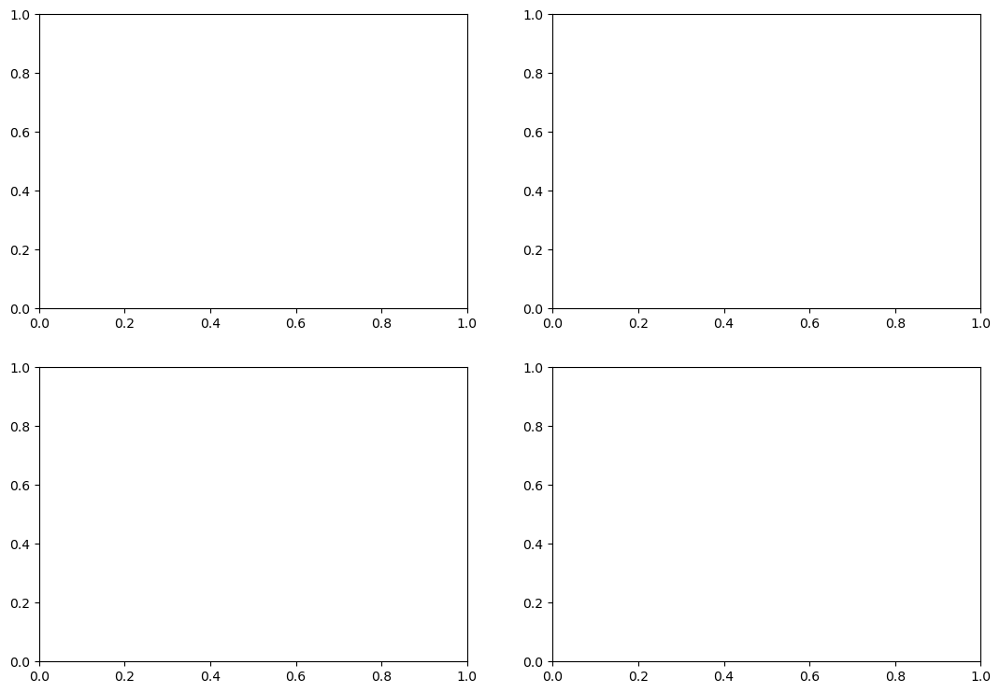

In [69]:
colors = sns.color_palette([
    '#ff9896',  # Light Red
    '#1f77b4',  # Bold Blue
    '#aec7e8',  # Light Blue
    '#ff7f0e',  # Bold Orange
    '#ffbb78',  # Light Orange
    '#2ca02c',  # Bold Green
    '#d62728',  # Bold Red
    '#9467bd',  # Bold Purple
    '#e377c2',  # Light Pink
    '#8c564b',  # Bold Brown
    '#7f7f7f',  # Gray
    '#bcbd22',  # Bold Yellow-Green
    '#17becf'   # Bold Cyan
])

# Set up the 2x2 grid of plots
fig, axs = plt.subplots(2, 2, figsize=(13, 9))


### Panel 1: East-West Trend vs. Upwelling Region Trend

# find linear fit from combined data
x_values = combine_model_data(trend_upwelling_region_dict)
y_values = combine_model_data(east_west_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[0, 0].plot(x_fit*10*12, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top right corner of the plot
axs[0, 0].text(0.4, 0.17, f'Slope: {slope:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')
# displsy correlation coefficient under slope
axs[0, 0].text(0.4, 0.15, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit


# Fourth subplot
for m in range(len(models)):
    axs[0, 0].scatter(trend_upwelling_region_dict[models[m]]*10*12, east_west_dict[models[m]]*10*12, label=models[m], color=colors[m], alpha=0.7)
    axs[0, 0].scatter((trend_upwelling_region_dict[models[m]]).mean()*10*12, (east_west_dict[models[m]]).mean()*10*12, color=colors[m], s=300, edgecolors='black', linewidths=1)
# obs
axs[0, 0].scatter(obs_trend_upwelling[0]*10*12,noaa_e.values[0], color='blue', label='NOAA OISST', marker='^', s=200)
axs[0, 0].scatter(obs_trend_upwelling[1]*10*12,cobe_e.values[0], color='purple', label='COBE', marker='^', s=200)
axs[0, 0].scatter(obs_trend_upwelling[2]*10*12,had_e.values[0], color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[0, 0].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[0, 0].set_xlim(-0.15, 0.5)
axs[0, 0].set_ylim(-0.18, 0.18)
axs[0, 0].set_xlabel(r'Upwelling Region Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 0].set_ylabel(r'East-West Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 0].set_title(r'Upwelling Region Trend Vs. East-West Trend',    fontsize=14)


# find linear fit from combined data
x_values = combine_model_data(trend_coldest5_dict)
y_values = combine_model_data(cold_warm_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[0, 1].plot(x_fit*10*12, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top right corner of the plot
axs[0, 1].text(0.4, 0.17, f'Slope: {slope:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')
# display correlation coefficient under slope
axs[0, 1].text(0.4, 0.15, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit



# Third subplot
for m in range(len(models)):
    axs[0, 1].scatter(trend_coldest5_dict[models[m]]*10*12, cold_warm_dict[models[m]]*10*12, label=models[m], color=colors[m], alpha=0.7)
    axs[0, 1].scatter((trend_coldest5_dict[models[m]]).mean()*10*12, (cold_warm_dict[models[m]]).mean()*10*12, color=colors[m], s=300, edgecolors='black', linewidths=1)
    
axs[0, 1].scatter(obs_trend_coldest5[0]*10*12,noaa_p.values[0], color='blue', label='NOAA OISST', marker='^', s=200)
axs[0, 1].scatter(obs_trend_coldest5[1]*10*12,cobe_p.values[0], color='purple', label='COBE', marker='^', s=200)
axs[0, 1].scatter(obs_trend_coldest5[2]*10*12,had_p.values[0], color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[0, 1].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[0, 1].set_xlim(-0.15, 0.5)
axs[0, 1].set_ylim(-0.18, 0.18)
axs[0, 1].set_xlabel(r'Coldest 5% Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 1].set_ylabel(r'Cold-Warm Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 1].set_title(r'Coldest 5% Trend Vs. Cold-Warm Trend',    fontsize=14)


# find linear fit from combined data
x_values = combine_model_data(mean_state_upwelling_region_dict)
y_values = combine_model_data(trend_upwelling_region_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[1, 0].plot(x_fit, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top left corner of the plot
axs[1, 0].text(0.35, 0.95, f'Slope:  {slope:.1e}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)
# display correlation coefficient under slope
axs[1, 0].text(0.35, 0.90, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit, corr


# First subplot
for m in range(len(models)):
    axs[1, 0].scatter(mean_state_upwelling_region_dict[models[m]],trend_upwelling_region_dict[models[m]]*10*12, label=models[m],color = colors[m],alpha=0.7)
    axs[1, 0].scatter((mean_state_upwelling_region_dict[models[m]]).mean(),(trend_upwelling_region_dict[models[m]]*12*10).mean(),color = colors[m],s=300,edgecolors='black', linewidths=1)
# axs[1, 0].scatter(23.0404478,-0.15146791, color='k',label='NOAA OISST',marker='^',s=200)
axs[1, 0].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
#obs
axs[1, 0].scatter(obs_mean_state_upwelling[0],obs_trend_upwelling[0]*10*12, color='blue', label='NOAA OISST', marker='^', s=200)
axs[1, 0].scatter(obs_mean_state_upwelling[1],obs_trend_upwelling[1]*10*12, color='purple', label='COBE', marker='^', s=200)
axs[1, 0].scatter( obs_mean_state_upwelling[2],obs_trend_upwelling[2]*10*12, color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[1, 0].set_xlim(21.25, 25.5)
axs[1, 0].set_ylim(-0.15, 0.5)
axs[1, 0].set_xlabel(r'Upwelling Region Mean state ($^{\circ}$C)')
axs[1, 0].set_ylabel(r'Upwelling Region trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[1, 0].set_title(r'Coastal Upwelling Mean State Vs. Trend of Coastal Upwelling', fontsize=14)



# find linear fit from combined data
x_values = combine_model_data(coldest5_mean_state_dict)
y_values = combine_model_data(trend_coldest5_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[1, 1].plot(x_fit, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top left corner of the plot
axs[1, 1].text(1.55, 0.95, f'Slope:  {slope:.1e}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)
# display correlation coefficient under slope
axs[1, 1].text(1.55, 0.90, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit, corr


# Second subplot
for m in range(len(models)):
    axs[1, 1].scatter(coldest5_mean_state_dict[models[m]], trend_coldest5_dict[models[m]]*12*10, label=models[m],color = colors[m],alpha=0.7)
    axs[1, 1].scatter(coldest5_mean_state_dict[models[m]].mean(),(trend_coldest5_dict[models[m]]*12*10).mean(),color = colors[m],s=300,edgecolors='black', linewidths=1)
# axs[1, 1].scatter(23.12,-0.00048827*38*12, color='k',label='NOAA OISST',marker='^',s=200)
axs[1, 1].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[1, 1].set_xlim(20.4, 23)
axs[1, 1].set_ylim(-0.15, 0.5)
axs[1, 1].scatter(obs_mean_state_coldest5[0],obs_trend_coldest5[0]*10*12, color='blue', label='NOAA OISST', marker='^', s=200)
axs[1, 1].scatter(obs_mean_state_coldest5[1],obs_trend_coldest5[1]*10*12, color='purple', label='COBE', marker='^', s=200)
axs[1, 1].scatter( obs_mean_state_coldest5[2],obs_trend_coldest5[2]*10*12, color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[1, 1].set_xlabel(r'Coldest 5% mean state ($^{\circ}$C)')
axs[1, 1].set_ylabel(r'Trend of the coldest 5% ($^{\circ}$C (10 yr)$^{-1}$)')
axs[1, 1].set_title(r'Coldest 5% Mean State Vs. Trend of Coldest 5%', fontsize=14)

# Adding labels a, b, c, d outside the top left corner of each subplot
axs[0, 0].text(-0.15, 1.05, "a", transform=axs[0, 0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[0, 1].text(-0.15, 1.05, "b", transform=axs[0, 1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[1, 0].text(-0.15, 1.05, "c", transform=axs[1, 0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[1, 1].text(-0.15, 1.05, "d", transform=axs[1, 1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Create a common legend
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize='medium', bbox_to_anchor=(1.13, 0.7))

# Adjust layout
plt.tight_layout()
# plt.show()

plt.savefig(os.path.expanduser("~/Desktop/fig4.png"), bbox_inches='tight')


- also correlation of model means

# Animation of SST maps for open day

In [2]:
NOAA_OISST = xr.open_dataset('/Users/isabelaconde/Desktop/NOAA_OISST_sst_mon_mean.nc')

In [14]:
NOAA_OISST

<xarray.Dataset>
Dimensions:  (time: 516, lat: 720, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2024-08-01
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
Data variables:
    sst      (time, lat, lon) float32 ...
Attributes:
    Conventions:    CF-1.5
    title:          NOAA/NCEI 1/4 Degree Daily Optimum Interpolation Sea Surf...
    institution:    NOAA/National Centers for Environmental Information
    source:         NOAA/NCEI https://www.ncei.noaa.gov/data/sea-surface-temp...
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Daily Optimum Interpolation Sea Surface Temperature
    version:        Version 2.1
    comment:        Reynolds, et al.(2007) Daily High-Resolution-Blended Anal...

In [15]:
# turn nc data in to pd dataframe with lat lon and time
data = NOAA_OISST.sel(time = slice('2022','2024'))#.sel(lat = slice(-40,40), lon = slice(110,300))
NOAA_OISST_df = data.to_dataframe().reset_index()
# make sure time is in datetime format
NOAA_OISST_df['time'] = pd.to_datetime(NOAA_OISST_df['time'])

In [10]:
import plotly.express as px
import pandas as pd


df = NOAA_OISST_df

# Convert Date to datetime
# df['Date'] = pd.to_datetime(df['Date'])

fig = px.scatter_mapbox(
    df,
    lat="lat",
    lon="lon",
    color="sst",
    animation_frame="time",
    color_continuous_scale="Thermal",
    range_color=(15, 30),  # Adjust based on the SST range in the tropical Pacific
    mapbox_style="carto-positron",
    zoom=1.3,  # Adjust zoom to fit the tropical Pacific
    center={"lat": 0, "lon": -160},  # Center map on the central tropical Pacific
    opacity=0.5,
    title="Sea Surface Temperature Over Time (Tropical Pacific Ocean)"
)

# Update layout to focus on the -20 to 20 latitude range
fig.update_layout(
    margin={"r":0,"t":0,"l":0,"b":0},
    mapbox=dict(
        bearing=0,
        center=dict(
            lat=0,
            lon=-160
        ),
        pitch=0,
        zoom=1.3,
    )
)

# Create a temporary directory for storing frames
temp_dir = tempfile.mkdtemp()

# Export each frame as an image to the temporary directory
for i, frame in enumerate(fig.frames):
    fig.update(frames=[frame])
    img_bytes = fig.to_image(format="png", engine="kaleido")
    with open(f'{temp_dir}/frame_{i:04d}.png', "wb") as f:
        f.write(img_bytes)

# Define the output path for the MP4
output_path = '/Users/isabelaconde/Desktop/sst_animation.mp4'  # Change this to your desired path

# Create a video from the frames and save it to the specified path
with imageio.get_writer(output_path, fps=2) as writer:
    for i in range(len(fig.frames)):
        image = imageio.imread(f'{temp_dir}/frame_{i:04d}.png')
        writer.append_data(image)

# Clean up the temporary frames directory
shutil.rmtree(temp_dir)




NameError: name 'tempfile' is not defined

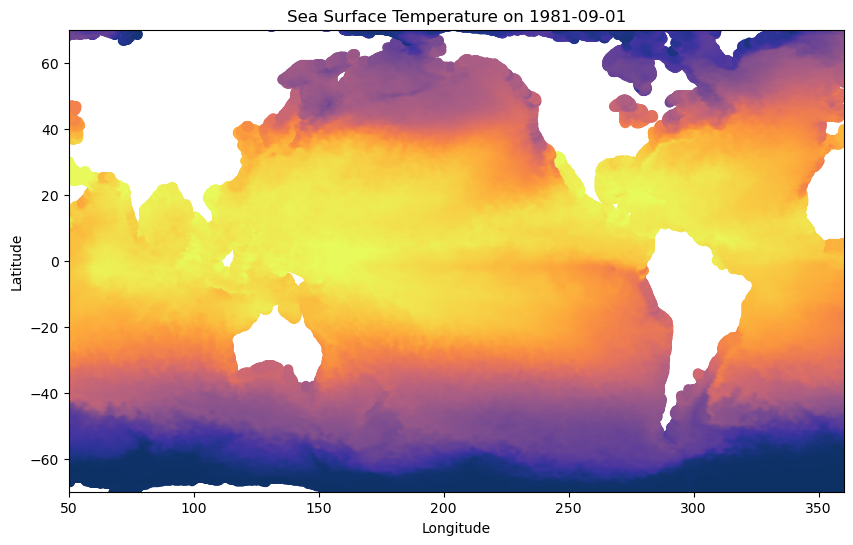

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cmocean.cm as cm
df = NOAA_OISST_df

# Prepare the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Set up the map boundaries and style
ax.set_xlim(50, 360)
ax.set_ylim(-70, 70)
ax.set_title('Sea Surface Temperature Over Time')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Scatter plot that will be updated
scatter = ax.scatter([], [], c=[], cmap='cmo.thermal', vmin=-5, vmax=30)

# Function to update the scatter plot
def update(frame):
    current_time = df['time'].unique()[frame]
    data_frame = df[df['time'] == current_time]
    
    scatter.set_offsets(np.c_[data_frame['lon'], data_frame['lat']])
    scatter.set_array(data_frame['sst'])
    
    ax.set_title(f'Sea Surface Temperature on {current_time.date()}')

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(df['time'].unique()), repeat=False)

# Save the animation as an MP4 file
output_path = '/Users/isabelaconde/Desktop/sst_animation.mp4'  # Change this to your desired path
ani.save(output_path, writer='ffmpeg', fps=2)

# plt.close(fig)  # Close the figure to prevent it from displaying in Jupyter notebooks


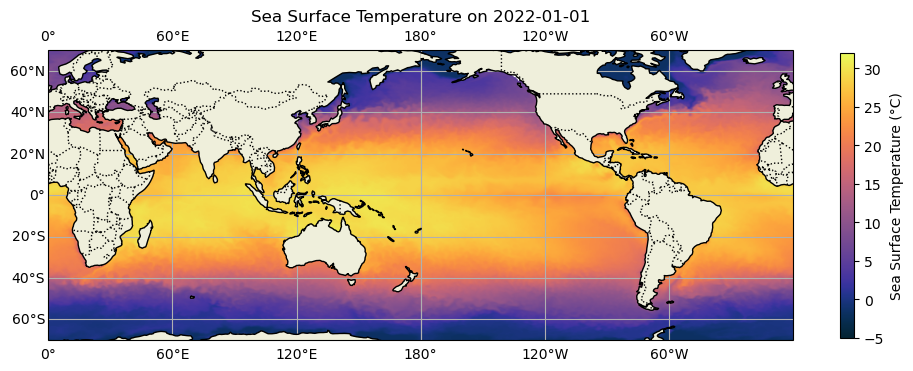

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cm
from cartopy.util import add_cyclic_point

# Assume df is your NOAA_OISST_df DataFrame
df = NOAA_OISST_df

# Create figure and axis using Cartopy for the projection (use PlateCarree for simplicity)
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

# Add coastlines and gridlines for context
ax.coastlines(zorder=3)
ax.add_feature(cfeature.BORDERS, linestyle=':',zorder=3)
ax.gridlines(draw_labels=True,zorder=3)


# Set up the extent of the map to cover the entire globe, centered on the Pacific
ax.set_extent([0, 360, -70, 70], crs=ccrs.PlateCarree())  # Extent for the global view

# Scatter plot that will be updated, reduced point size (s) to make points smaller
scatter = ax.scatter([], [], c=[], s=0.1, cmap=cm.thermal, vmin=-5, vmax=32, transform=ccrs.PlateCarree(), zorder=1)
# contour = ax.contourf(lon_grid, lat_grid, np.zeros_like(lon_grid), cmap=cm.thermal, vmin=-5, vmax=30, zorder=2)

# Add land feature to mask out points over land
land = cfeature.NaturalEarthFeature('physical', 'land', '110m', facecolor='none')
ax.add_feature(cfeature.LAND, zorder=2, edgecolor='black', linewidth=0.1)

# Add a color bar
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.05,shrink =0.5)
cbar.set_label('Sea Surface Temperature (°C)')

fig.tight_layout()

# Function to update the scatter plot
def update(frame):
    current_time = df['time'].unique()[frame]
    data_frame = df[df['time'] == current_time]
    
    # Mask points over land (if needed)
    scatter.set_offsets(np.c_[data_frame['lon'], data_frame['lat']])
    scatter.set_array(data_frame['sst'])

    ax.set_title(f'Sea Surface Temperature on {current_time.date()}')

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(df['time'].unique()), repeat=False)

# Save the animation as an MP4 file
output_path = '/Users/isabelaconde/Desktop/sst_animation.mp4'  # Change this to your desired path
ani.save(output_path, writer='ffmpeg', fps=2)

# plt.close(fig)  # Close the figure to prevent it from displaying in Jupyter notebooks


/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_11814/1623697190.py:49: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for coll in contour.collections:
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_11814/1623697190.py:49: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for coll in contour.collections:


ValueError: list.remove(x): x not in list

Error in callback <function _draw_all_if_interactive at 0x130a8f6a0> (for post_execute), with arguments args (),kwargs {}:


/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_11814/1623697190.py:49: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for coll in contour.collections:


ValueError: list.remove(x): x not in list

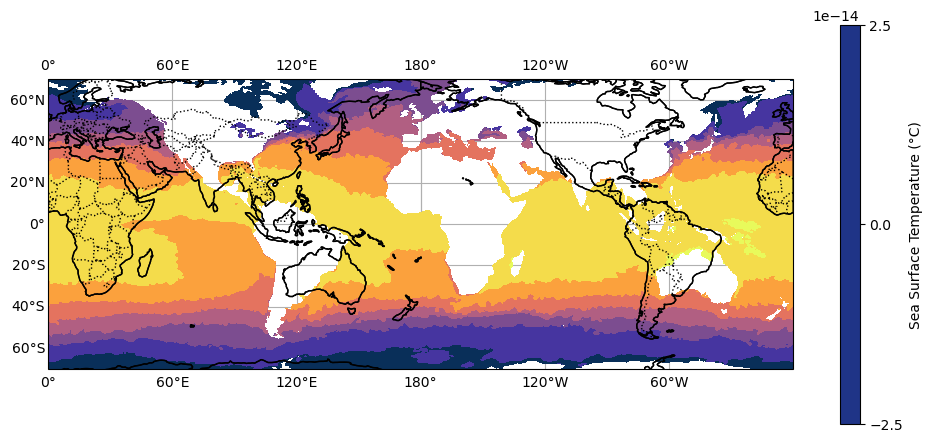

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cm

# Assume df is your NOAA_OISST_df DataFrame
df = NOAA_OISST_df

# Prepare the grid for contour plotting
lon = df['lon'].unique()
lat = df['lat'].unique()
lon_grid, lat_grid = np.meshgrid(lon, lat)

# Create figure and axis using Cartopy for the projection (use PlateCarree for simplicity)
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})

# Add coastlines and gridlines for context
ax.coastlines(zorder=3)  # Coastlines above the contour plot
ax.add_feature(cfeature.BORDERS, linestyle=':', zorder=3)  # Borders above the contour plot
ax.gridlines(draw_labels=True, zorder=2)  # Gridlines above contour but below land

# Add land feature to bring landmasses in front of contour plot
ax.add_feature(cfeature.LAND, zorder=4, facecolor='none', edgecolor='black')

# Set up the extent of the map to cover the entire globe, centered on the Pacific
ax.set_extent([0, 360, -70, 70], crs=ccrs.PlateCarree())  # Extent for the global view

# Initial empty contour plot that will be updated
contour = ax.contourf(lon_grid, lat_grid, np.zeros_like(lon_grid), cmap=cm.thermal, vmin=-5, vmax=30, zorder=2)

# Add a color bar with shrink to align with the map
cbar = fig.colorbar(contour, ax=ax, orientation='vertical', pad=0.05, shrink=0.7)
cbar.set_label('Sea Surface Temperature (°C)')

# Tighten the layout to remove excessive white space
fig.tight_layout()

# Function to update the contour plot
def update(frame):
    current_time = df['time'].unique()[frame]
    data_frame = df[df['time'] == current_time]

    # Reshape SST data for contour plot
    sst_values = data_frame.pivot(index='lat', columns='lon', values='sst').values

    # Clear the previous contours before drawing new ones
    for coll in contour.collections:
        coll.remove()

    # Plot new contours
    new_contour = ax.contourf(lon_grid, lat_grid, sst_values, cmap=cm.thermal, vmin=-5, vmax=30, zorder=2)

    # Update the contour object reference for the next update
    return new_contour

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(df['time'].unique()), repeat=False)

# Save the animation with minimized white space
output_path = '/Users/isabelaconde/Desktop/sst_animation.mp4'  # Change this to your desired path
ani.save(output_path, writer='ffmpeg', fps=2)

# plt.close(fig)  # Close the figure to prevent it from displaying in Jupyter notebooks


# Plots for merica_long talk

In [697]:
NOAA_OISST = xr.open_dataset('/Users/isabelaconde/Desktop/NOAA_OISST_sst_mon_mean.nc')
noaa_avg = NOAA_OISST.mean(dim='time').sst

def mask_pacific(data,lat,lon):
    temp_con = data # temperature grid to choose
    ##################
    import math
    import matplotlib
    import numpy as np
    
    LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(12)*360
    LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]
    x_pixel_pos = LonsPts_pos
    y_pixel_pos = LatsPts_pos
    
    temp_list = []
    for a, b in zip(x_pixel_pos, y_pixel_pos):
        temp_list.append([a, b])
    
    polygon = np.array(temp_list)
    
    xv, yv = temp_con[lon].values, temp_con[lat].values
    lon2d, lat2d = np.meshgrid(xv, yv)
    points = np.hstack((lon2d.reshape((-1,1)), lat2d.reshape((-1,1))))
    path = matplotlib.path.Path(polygon)
    mask = path.contains_points(points)
    mask.shape = lon2d.shape
    mask_bit_pos = mask*np.ones_like(lon2d)
    
    
    mask_tot = mask_bit_pos#+mask_bit_neg
    mask_zero = mask_bit_pos
    
    mask_tot[mask_tot==0] = np.nan
    mask_mods = mask_tot
    return mask_tot

mask = mask_pacific(noaa_avg,'lat','lon')
noaa_avg_masked = noaa_avg*mask
noaa_pa = (NOAA_OISST*mask).sst.sel(lat = slice(-20,20), lon = slice(110,290))
noaa_avg_pacific = noaa_avg_masked.sel(lat = slice(-20,20), lon = slice(110,290))

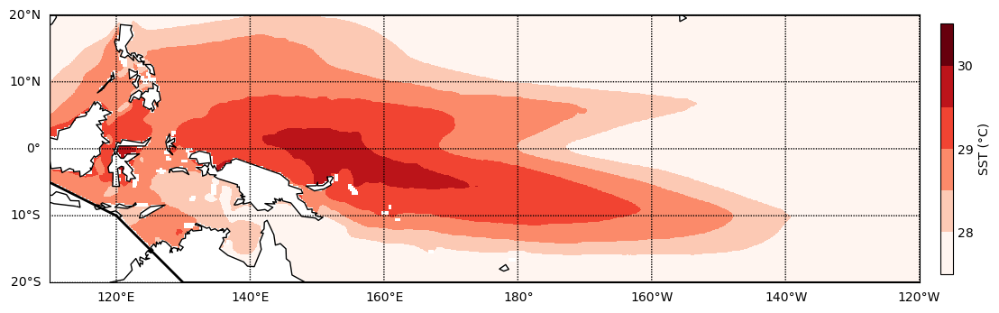

In [637]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=110, urcrnrlon=240, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap = plt.cm.Reds
norm = mcolors.BoundaryNorm(boundaries=[0, 28, 28.5,29,29.5,30,30.5], ncolors=256)


# Add the imshow plot
im = trend_map.imshow(noaa_avg_pacific.sel(lon = slice(110,240)), cmap=cmap, norm=norm)

# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.02, aspect=20, shrink = 0.45)
cbar.ax.tick_params(length=0)  # Set tick mark length to 0

cbar.set_label('SST (°C)')  # Label for the color bar

# cbar.set_ticks([28, 29, 30])               # Set specific tick positions
cbar.set_ticklabels(['','28','', '29','', '30',''])    # Set tick labels

# Remove all tick marks
cbar.ax.tick_params(length=0)              # Remove tick marks (dashes)


# Add title and labels if needed
# plt.title('Sea Surface Temperature')

plt.show()


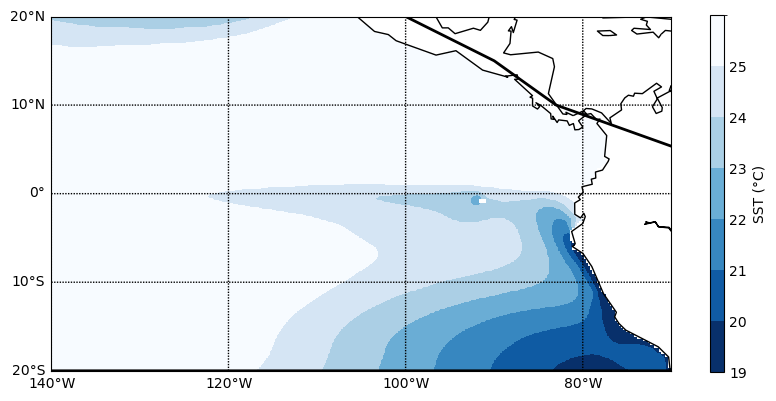

In [756]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(10,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=220, urcrnrlon=290, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap = plt.cm.Blues_r
norm = mcolors.BoundaryNorm(boundaries=[ 19,20,21,22,23,24,25,26], ncolors=256)


# Add the imshow plot
im = trend_map.imshow(noaa_avg_pacific.sel(lon = slice(220,290)), cmap=cmap, norm=norm)

# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.05, aspect=25, shrink = 0.58)
cbar.set_label('SST (°C)')  # Label for the color bar

cbar.set_ticks([19, 20,21,22,23,24,25])               # Set specific tick positions
cbar.set_ticklabels(['19', '20','21','22','23','24','25'])    # Set tick labels
# Remove all tick marks
cbar.ax.tick_params(length=0)              # Remove tick marks (dashes)



# Add title and labels if needed
# plt.title('Sea Surface Temperature')

plt.show()


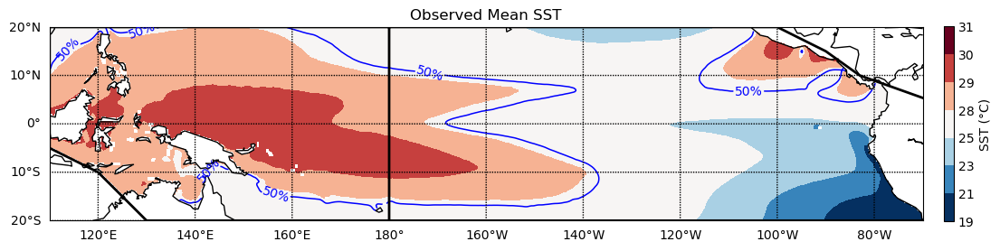

In [795]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130,180,180] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20,-20,20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=110, urcrnrlon=290, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap ='RdBu_r'# plt.cm.Reds
norm = mcolors.BoundaryNorm(boundaries=[19,21,23,25,28,29,30,31], ncolors=260)


# Add the imshow plot
im = trend_map.imshow(noaa_avg_pacific, cmap=cmap,norm=norm)

CS=noaa_avg_pacific.sel(lat=slice(-20, 20)).sel(lon=slice(110, 290)).plot.contour(levels=[percentiles_timemean_noaa.sel(area=0.5).values], colors=['blue'], zorder=1, linewidths=1.1, add_labels=False, add_colorbar=False, vmin=19, vmax=31)

fmt = {}
strs = ['50%']
for l, s in zip(CS.levels, strs):
    fmt[l] = s

# # Label every other level using strings
plt.clabel(CS, CS.levels[::1], inline=True, fmt=fmt, fontsize=10)


# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.02, aspect=20, shrink = 0.35)
cbar.ax.tick_params(length=0)  # Set tick mark length to 0

cbar.set_label('SST (°C)')  # Label for the color bar

# Add title and labels if needed
plt.title('Observed Mean SST')

plt.savefig(os.path.expanduser("~/Desktop/warmcold.png"), bbox_inches='tight')


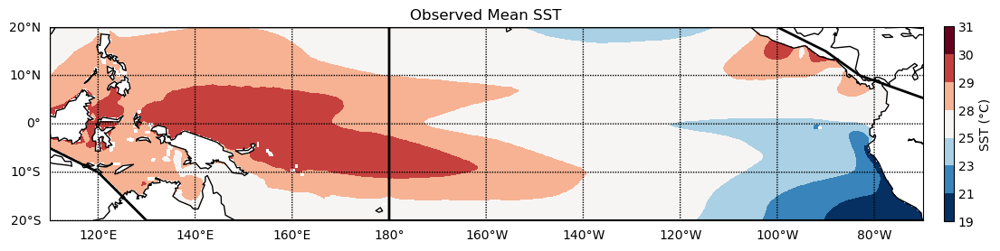

In [797]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130,180,180] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20,-20,20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=110, urcrnrlon=290, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap ='RdBu_r'# plt.cm.Reds
norm = mcolors.BoundaryNorm(boundaries=[19,21,23,25,28,29,30,31], ncolors=260)


# Add the imshow plot
im = trend_map.imshow(noaa_avg_pacific, cmap=cmap,norm=norm)

# CS=noaa_avg_pacific.sel(lat=slice(-20, 20)).sel(lon=slice(110, 290)).plot.contour(levels=[percentiles_timemean_noaa.sel(area=0.5).values], colors=['blue'], zorder=1, linewidths=1.1, add_labels=False, add_colorbar=False, vmin=19, vmax=31)

fmt = {}
strs = ['50%']
for l, s in zip(CS.levels, strs):
    fmt[l] = s

# # Label every other level using strings
# plt.clabel(CS, CS.levels[::1], inline=True, fmt=fmt, fontsize=10)


# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.02, aspect=20, shrink = 0.35)
cbar.ax.tick_params(length=0)  # Set tick mark length to 0

cbar.set_label('SST (°C)')  # Label for the color bar

# Add title and labels if needed
plt.title('Observed Mean SST')

plt.savefig(os.path.expanduser("~/Desktop/warmcold.png"), bbox_inches='tight')


In [692]:
# import packages
# 
# 
import numpy as np
import xarray as xr
import datatree
import matplotlib
import math


from datatree import DataTree
# from xmip.postprocessing import _parse_metric

import cartopy.crs as ccrs

# import xskillscore as xs
import matplotlib.pyplot as plt
%matplotlib inline
import calendar
from matplotlib.lines import Line2D

import os
import re
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy.stats import norm

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.gridspec import GridSpec

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import matplotlib.patches as patches

from scipy.stats import scoreatpercentile

from xhistogram.xarray import histogram


In [690]:
def find_percentilels_time_avg(hist_data,lat_var):
    weights = np.cos(np.deg2rad(hist_data[lat_var]))
    const_area=np.r_[0:1:0.01]
    temps = np.r_[12:34:0.5] # define temperatures for binning 

    h=histogram(hist_data,bins=temps,weights=weights).cumsum()
    hh = (h - h[0])/(h[-1]-h[0])
    temps_interp=np.interp(const_area,hh,temps[1:])

    mmm_percentiles = xr.DataArray(temps_interp, coords ={'area':const_area})
    return mmm_percentiles

def percentiles_timeseries(data, lat_var):

    hist_T = data
    weights = np.cos(np.deg2rad(hist_T[lat_var]))
    times = hist_T['time']
    const_area=np.r_[0:1:0.01]
    temps = np.r_[12:34:0.5] # define temperatures for binning 

    temps_interp = np.empty([len(times),len(const_area)])

    for i in np.r_[0:len(times):1]:  
        h=histogram(hist_T[i],bins=temps,weights=weights).cumsum()
        hh = (h - h[0])/(h[-1]-h[0])
        temps_interp[i]=np.interp(const_area,hh,temps[1:])


    sst_area= xr.DataArray(temps_interp,coords={'time':times,'area':const_area})

    return sst_area

def linear_fit_percentiles(data):
    # initialise datatrees and dicts
    x_val = np.arange(len(data['time'])) # from 1982 to 2020
    areas = data['area'].values
    

    # find linear fits for warm and cold regions
    slope=[np.polyfit(x_val, data.isel(area=j), 1)[0] for j in range(len(areas))]

    da = xr.DataArray(slope, coords ={'area':areas},name = 'trend')

    
    return da

In [699]:
percentiles_timemean_noaa = find_percentilels_time_avg(noaa_avg_pacific,'lat')
percentiles_noaa = percentiles_timeseries(noaa_pa,'lat')
print('noaa done')

noaa done


In [708]:
percentiles_noaa.sel(time='2015-12').sel(area=0.5).values[0]

28.36283404398387

## El Nino year 2015-12


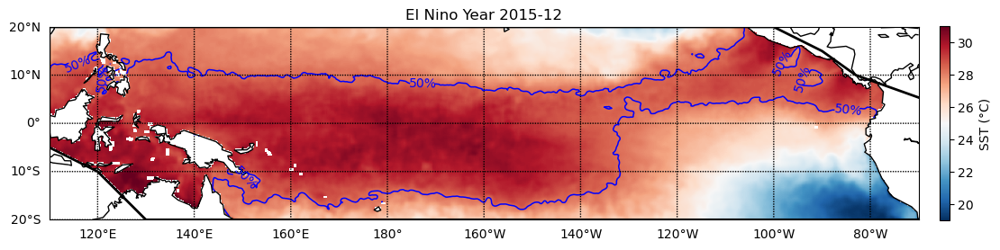

In [723]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

sst_data = noaa_pa.sel(time = '2015-12').squeeze()

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=110, urcrnrlon=290, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap ='RdBu_r'# plt.cm.Reds


# Add the imshow plot
im = trend_map.imshow(sst_data, cmap=cmap, vmin=19, vmax=31)

CS=sst_data.sel(lat=slice(-20, 20)).sel(lon=slice(110, 290)).plot.contour(levels=percentiles_noaa.sel(time='2015-12').sel(area=0.5).values, colors=['blue'], zorder=1, linewidths=1.1, add_labels=False, add_colorbar=False, vmin=19, vmax=31)

fmt = {}
strs = ['50%']
for l, s in zip(CS.levels, strs):
    fmt[l] = s

# # Label every other level using strings
plt.clabel(CS, CS.levels[::1], inline=True, fmt=fmt, fontsize=10)

# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.02, aspect=20, shrink = 0.35)

cbar.set_label('SST (°C)')  # Label for the color bar

# Add title and labels if needed
plt.title('El Nino Year 2015-12')

plt.show()


## La nina year 1998-1999

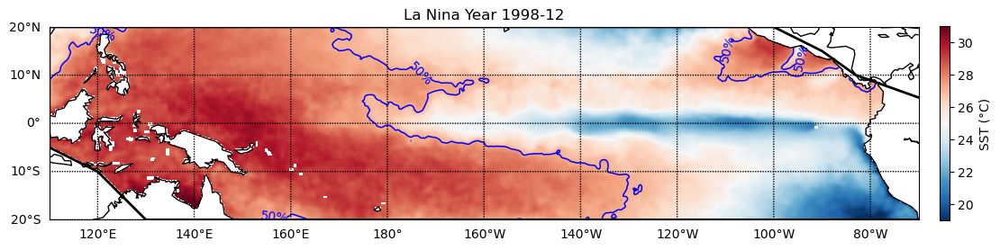

In [724]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

sst_data = noaa_pa.sel(time = '1998-12').squeeze()

LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]


x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

outline_coords = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    outline_coords.append([a, b])
outline_coords

# Split the coordinates into separate lists for longitude and latitude
lons, lats = zip(*outline_coords)

# plot trend sst maps
# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15,8))
# gs = GridSpec(1, 1, figure=fig)#
# gs.update(wspace=0.1, hspace=-0.7) # set the spacing between axes. 


# Plot for NOAA

trend_map = Basemap(width=6000000, height=12000000, projection='cyl', llcrnrlat=-20, urcrnrlat=20, llcrnrlon=110, urcrnrlon=290, area_thresh=10000)
trend_map.drawcoastlines()
trend_map.drawparallels(np.arange(-20, 20.1, 10.), labels=[1, 0, 0, 0])
trend_map.drawmeridians(np.arange(-180., 181., 20.), labels=[0, 0, 0, 1])


# Convert latitude and longitude to map projection coordinates
x, y = trend_map(lons, lats)

# Plot the custom outline
trend_map.plot(x, y, marker=None, color='k', linewidth=2)


# Define a custom colormap: red scale with pale red for values < 28
cmap ='RdBu_r'# plt.cm.Reds


# Add the imshow plot
im = trend_map.imshow(sst_data, cmap=cmap, vmin=19, vmax=31)

CS=sst_data.sel(lat=slice(-20, 20)).sel(lon=slice(110, 290)).plot.contour(levels=percentiles_noaa.sel(time='1998-12').sel(area=0.5).values, colors=['blue'], zorder=1, linewidths=1.1, add_labels=False, add_colorbar=False, vmin=19, vmax=31)

fmt = {}
strs = ['50%']
for l, s in zip(CS.levels, strs):
    fmt[l] = s

# # Label every other level using strings
plt.clabel(CS, CS.levels[::1], inline=True, fmt=fmt, fontsize=10)

# Add a color bar
cbar = plt.colorbar(im, orientation='vertical', pad=0.02, aspect=20, shrink = 0.35)

cbar.set_label('SST (°C)')  # Label for the color bar

# Add title and labels if needed
plt.title('La Nina Year 1998-12')

plt.show()
